##### Make sure to install plotly and cufflinks
**pip install plotly <br>**
**conda install -c conda-forge cufflinks-py**

In [16]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import cufflinks as cf
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

cf.go_offline()

<AxesSubplot:>

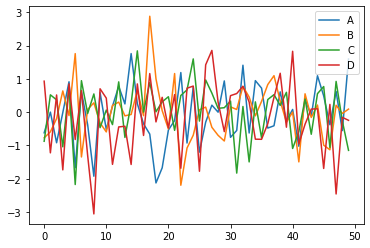

In [17]:
arr_1 = np.random.randn(50,4)
df_1 = pd.DataFrame(arr_1, columns=['A', 'B', 'C', 'D'])
df_1.head()
df_1.plot()

In [18]:
df_1.iplot()

In [20]:
#Line Plots
import plotly.graph_objects as go
df_stocks = px.data.stocks()

df_stocks.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [24]:
#plotting a line plot
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y': 'Price'})

In [23]:
#plotting multiple lines in one plot
px.line(df_stocks, x='date', y=['GOOG', 'AAPL'], labels={'x':'Date', 'y': 'Price'}, title='Google vs Apple')

In [41]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2, dash='dashdot')))

fig.update_layout(title='Stock Price', xaxis_title='Date', yaxis_title='Price')

fig.update_layout(
xaxis=dict(
showline=True, showgrid=True, showticklabels=True,
linecolor='rgb(204, 204, 204)',
linewidth=2, ticks='outside', tickfont=dict(
family='Arial', size=12, color='rgb(82,82,82)',
),
),
yaxis=dict(showgrid=True, zeroline=False, showline=True,
          showticklabels=False),
autosize=False,
margin=dict(
autoexpand=False, l=100, r=20, t=110),
showlegend=False, plot_bgcolor='white')

#### BAR CHARTS

In [42]:
df_us = px.data.gapminder().query("country == 'United States'")
df_us.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
1608,United States,Americas,1952,68.44,157553000,13990.48208,USA,840
1609,United States,Americas,1957,69.49,171984000,14847.12712,USA,840
1610,United States,Americas,1962,70.21,186538000,16173.14586,USA,840
1611,United States,Americas,1967,70.76,198712000,19530.36557,USA,840
1612,United States,Americas,1972,71.34,209896000,21806.03594,USA,840


In [44]:
px.bar(df_us, x='year', y='pop')

In [46]:
#stacked bar
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex',
      title='Tips by Sex on Each Day')

In [52]:
#changing the label name
px.bar(df_tips, x='day', y='tip', color='sex',
      labels={'tip': 'Tip Amount', 'day': 'Day of the Week'})

In [49]:
px.bar(df_tips, x='sex', y='total_bill', color='smoker', barmode='group')

In [53]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")

In [54]:
fig =px.bar(df_europe, y='pop', x='country', text='pop', color='country')
fig

In [58]:
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45)

#### SCATTER PLOTS

In [59]:
df_iris = px.data.iris()

In [60]:
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length', hover_data=['petal_width'])

In [64]:
fig = go.Figure()
fig.add_trace(go.Scatter(
x=df_iris.sepal_width, y=df_iris.sepal_length,
mode='markers',
marker_color=df_iris.sepal_width,
text=df_iris.species, marker=dict(showscale=True)))

fig.update_traces(marker_line_width=2, marker_size=10)

In [75]:
fig = go.Figure(data=go.Scattergl(
x = np.random.randn(100000),
y = np.random.randn(100000),
mode='markers',
marker=dict(
color=np.random.randn(100000),
colorscale='Viridis',
line_width=1)))

fig

#### PIE CHART

In [90]:
df_asia = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
df_asia

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
95,Bahrain,Asia,2007,75.635,708573,29796.048340,BHR,48
107,Bangladesh,Asia,2007,64.062,150448339,1391.253792,BGD,50
227,Cambodia,Asia,2007,59.723,14131858,1713.778686,KHM,116
299,China,Asia,2007,72.961,1318683096,4959.114854,CHN,156
671,"Hong Kong, China",Asia,2007,82.208,6980412,39724.978670,HKG,344
707,India,Asia,2007,64.698,1110396331,2452.210407,IND,356
719,Indonesia,Asia,2007,70.650,223547000,3540.651564,IDN,360
731,Iran,Asia,2007,70.964,69453570,11605.714490,IRN,364
743,Iraq,Asia,2007,59.545,27499638,4471.061906,IRQ,368


In [73]:
px.pie(df_asia, values='pop', names='country',
      title='Population of Asian Countries')
      #color_discrete_sequence=px.colors.sequential.RdBu)


In [81]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water','Grass','Normal','Psychic', 'Fire', 'Ground'], 
                       values=[110,90,80,80,70,60])])
# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=15,
                  textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))

#### FACET PLOTS

In [87]:
# You can create numerous subplots
df_tips = px.data.tips()
px.scatter(df_tips, x="total_bill", y="tip", color="smoker", facet_col="sex")


In [88]:
# We can line up data in rows and columns
px.histogram(df_tips, x="total_bill", y="tip", color="sex", facet_row="time", facet_col="day",
       category_orders={"day": ["Thur", "Fri", "Sat", "Sun"], "time": ["Lunch", "Dinner"]})



In [89]:
# This dataframe provides scores for different students based on the level
# of attention they could provide during testing
att_df = sns.load_dataset("attention")
fig = px.line(att_df, x='solutions', y='score', facet_col='subject',
             facet_col_wrap=5, title='Scores Based on Attention')
fig

#### Animation

In [83]:
# Create an animated plot that you can use to cycle through continent
# GDP & life expectancy changes
df_cnt = px.data.gapminder()
px.scatter(df_cnt, x="gdpPercap", y="lifeExp", animation_frame="year", 
           animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])


In [84]:
# Watch as bars chart population changes
px.bar(df_cnt, x="continent", y="pop", color="continent",
  animation_frame="year", animation_group="country", range_y=[0,4000000000])